#Install Libraries

In [ ]:
!pip install git+https://github.com/huggingface/transformers

In [ ]:
!pip install jupyterlab ipywidgets bertviz xformers evaluate matplotlib torchvision

In [ ]:
!pip install torchvision

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from transformers import BertModel, BertTokenizer
from bertviz.transformers_neuron_view import BertModel, BertTokenizer
from bertviz.neuron_view import show
from transformers import pipeline
from sklearn.manifold import TSNE
import pandas as pd
import torch
import torchvision

# Embedding Visualization of Tokens through Sinusoid Waves

## Tokenaization Text Input

In [8]:
from transformers import BertModel, BertTokenizer
model = "bert-base-uncased"
tokenizer_bert = BertTokenizer.from_pretrained(model)
model_bert = BertModel.from_pretrained(model)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [9]:
tokenized_num = tokenizer_bert("I live in Montreal and i like this city.")
print(tokenized_num)

{'input_ids': [101, 1045, 2444, 1999, 5548, 1998, 1045, 2066, 2023, 2103, 1012, 102], 'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


In [ ]:
tokens_char = tokenizer_bert.convert_ids_to_tokens(tokenized_num["input_ids"])
print(tokens_char)

['[CLS]', 'i', 'live', 'in', 'montreal', 'and', 'i', 'like', 'this', 'city', '.', '[SEP]']


## Positional encodding

In [ ]:
def encode(num_tokens, depth, n=10000):
    position = np.zeros((num_tokens, depth))
    for row in range(num_tokens):
        for col in np.arange(int(depth/2)):
            denominator = np.power(n, 2*col/depth)
            position[row, 2*col] = np.sin(row/denominator)
            position[row, 2*col+1] = np.cos(row/denominator)
    return position

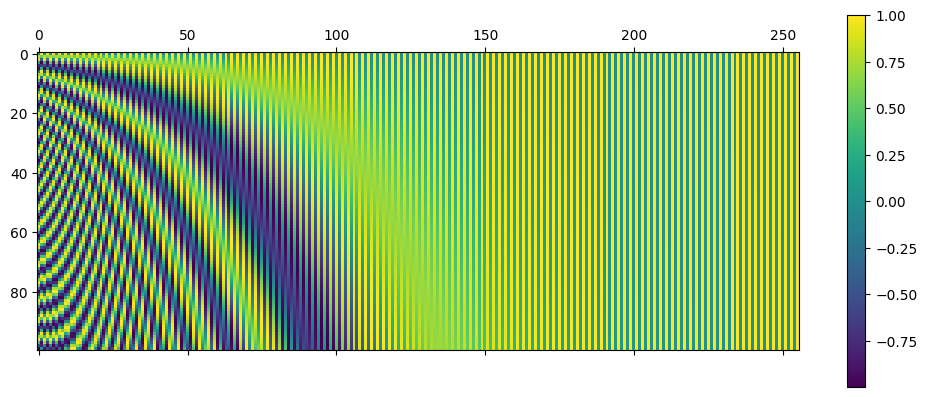

In [ ]:
positionalMatrix = encode(100, 256)
fig = plt.matshow(positionalMatrix)
plt.gcf().colorbar(fig)

## Visualization Self-Attention Module

In [47]:
model = "bert-base-uncased"
tokenizer_bert = BertTokenizer.from_pretrained(model)
model_bert = BertModel.from_pretrained(model)
show(model_bert, "bert", tokenizer_bert, "I live in Montreal and I like this city.", display_mode="dark", head=9)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
show(model_bert, "bert", tokenizer_bert, "I live in Montreal and I like this city.", display_mode="light", head=9)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Word embedding visualization

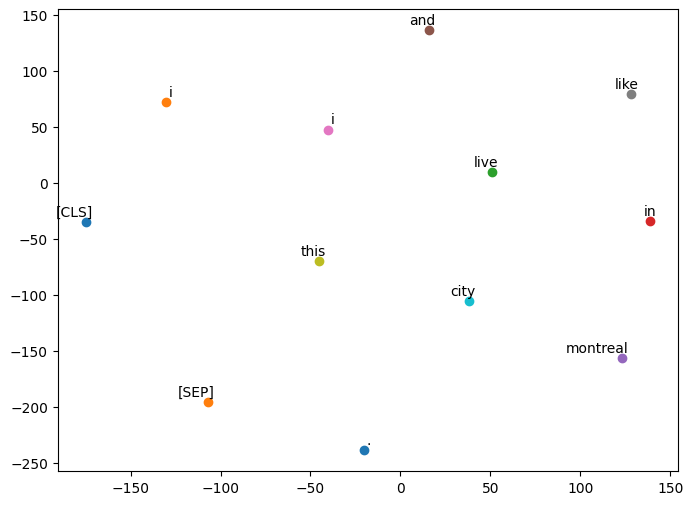

In [24]:
# Extract embeddings
tokenized_text = tokenizer_bert("I live in Montreal and I like this city.", return_tensors="pt")
with torch.no_grad():
    outputs = model_bert(**tokenized_text)
embeddings = outputs.last_hidden_state.squeeze().numpy()

# Use t-SNE for dimensionality reduction
tsne_model = TSNE(perplexity=10, n_components=2, init='pca', n_iter=2500, random_state=23)
new_values = tsne_model.fit_transform(embeddings)

# Plotting
df = pd.DataFrame(new_values, columns=['x', 'y'])
df['token'] = tokenizer_bert.convert_ids_to_tokens(tokenized_text['input_ids'].squeeze().tolist())

plt.figure(figsize=(8, 6))
for i, token in enumerate(df['token']):
    plt.scatter(df.iloc[i]['x'], df.iloc[i]['y'])
    plt.annotate(token, xy=(df.iloc[i]['x'], df.iloc[i]['y']), xytext=(5, 2), textcoords='offset points', ha='right', va='bottom')
plt.show()


# Using GPT2 model with 137M parameters

## generating text based on input

In [32]:
gpt = pipeline('text-generation', model='gpt2')
gpt("I enjoy hiking and running.", max_length=20, num_return_sequences=3)


Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


[{'generated_text': 'I enjoy hiking and running. It reminds me of living in a house with two walls in front and'},
 {'generated_text': 'I enjoy hiking and running. I often get great results.\n\nI am also very passionate and'},
 {'generated_text': 'I enjoy hiking and running. This year we were able to get 3 times what we had before.'}]

In [35]:
#one of the resources is wikipedia for gpt-2 enginee search
gpt("montreal is a good place for sport." , max_length=50, num_return_sequences=5)


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


[{'generated_text': 'montreal is a good place for sport.\n\nMédecins Sans Frontières was invited to the 2012 IAAF World Championships for the first time, and was honoured to represent the sport in the London 2012 Olympics.'},
 {'generated_text': "montreal is a good place for sport. However, if you live or see a team that likes to throw a few more inches, then I guarantee you will be at a disadvantage.\n\nI'm not saying you need to come to the Red"},
 {'generated_text': "montreal is a good place for sport.\n\nIt's also where there are a lot of beautiful parks and the Riverbank Park is full of spectacular art.\n\nMy parents lived there because of the local parks when I was one, but"},
 {'generated_text': "montreal is a good place for sport. The city is home to the Canadian Olympic Park — which is named for two athletes the city selected as the 2018 Toronto Winter Games – and the Toronto Zoo's zoo and aquarium.\n\nRicardo Al"},
 {'generated_text': 'montreal is a good place for sport. You 

##Sentiment Analysis

In [23]:
# Sentiment Analysis
from transformers import pipeline
sentiment_pipeline = pipeline("sentiment-analysis")
print(sentiment_pipeline("I love Montreal, it's a fantastic city!"))

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


[{'label': 'POSITIVE', 'score': 0.9998869895935059}]


In [22]:
# Sentiment Analysis
from transformers import pipeline
sentiment_pipeline = pipeline("sentiment-analysis")
print(sentiment_pipeline("I hate fighting."))

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


[{'label': 'NEGATIVE', 'score': 0.9791591167449951}]
